----------------------------
# Session 4 : Object detection
----------------------------



## Import the necesessary packages

In [1]:
import numpy as np
import torch
from torch import nn
import torchvision
import torchvision.transforms.functional as F
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import sys
in_colab = 'google.colab' in sys.modulesimport sys
in_colab = 'google.colab' in sys.modules
if in_colab:
    from google.colab import drive
    drive.mount('/content/drive')
    %cd 
    !rm -r data
    !git init data
    %cd data
    !git remote add -f origin https://github.com/DrLSimon/DL_Labs_3AISIA.git
    !git config core.sparseCheckout true
    !echo "4_detection_files" >> .git/info/sparse-checkout
    !git pull origin main
    !ls .


## Load the Pascal VOC dataset for object detection

In [3]:
from torchvision.datasets import VOCDetection
from torchvision import transforms
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
trainset = VOCDetection(root='/tmp/',download=True)
testset = VOCDetection(root='/tmp/',download=True,image_set='val')

Using downloaded and verified file: /tmp/VOCtrainval_11-May-2012.tar
Extracting /tmp/VOCtrainval_11-May-2012.tar to /tmp/
Using downloaded and verified file: /tmp/VOCtrainval_11-May-2012.tar
Extracting /tmp/VOCtrainval_11-May-2012.tar to /tmp/


# Part 1: single (largest) object detection

In [4]:
class SingleBoxVOCDataset():
    '''Mini wrapper around VOCDetection  meant to
         - simplify the interaction with DataLoader 
         - extract a single box per image (the largest one)
    '''
    def __init__(self,internal_dataset:VOCDetection, imgsize:tuple, maxsamples=None):
        self.internal_dataset = internal_dataset
        total_nsamples = len(internal_dataset)
        self.names2labels = {'horse': 0, 'person': 1, 'bottle': 2, 'dog': 3, 'tvmonitor': 4, 'car': 5, 'aeroplane': 6, 'bicycle': 7, 'boat': 8, 'chair': 9, 'diningtable': 10, 'pottedplant': 11, 'train': 12, 'cat': 13, 'sofa': 14, 'bird': 15, 'sheep': 16, 'motorbike': 17, 'bus': 18, 'cow': 19}
        self.labels2names = ['horse', 'person', 'bottle', 'dog', 'tvmonitor', 'car', 'aeroplane', 'bicycle', 'boat', 'chair', 'diningtable', 'pottedplant', 'train', 'cat', 'sofa', 'bird', 'sheep', 'motorbike', 'bus', 'cow']
        self.nsamples = maxsamples if maxsamples is not None else total_nsamples
        labels, bboxes = self.__extract_labels_and_boxes()
        self.C = len(self.names2labels)
        self.__compute_targets(labels, bboxes)
        
        self.imgtransform = transforms.Compose([transforms.Resize(imgsize), 
                                                transforms.ToTensor(),
                                                # imagenet normalization
                                                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                                     std=[0.229, 0.224, 0.225])
                                               ])
       
    def __extract_labels_and_boxes(self):
        labels = []
        bboxes = []
        for k in range(self.nsamples):
            img, annotation = self.internal_dataset[k]          
            objects = annotation['annotation']['object']
            sample_labels=self.__extract_labels(objects)
            sample_bboxes=self.__extract_bboxes(img.size, objects)
            labels.append(sample_labels)
            bboxes.append(sample_bboxes)
        return labels, bboxes
    
    def __extract_labels(self, objects):
        labels =  []
        for obj in objects:
            labelname = obj['name']
            if labelname not in self.names2labels:
                self.names2labels[labelname] = len(self.names2labels)
                self.labels2names.append(labelname)
            labels.append(self.names2labels[labelname])
        return labels
        
    def __extract_bboxes(self, imgsize, objects):
        bboxes = [d['bndbox'] for d in objects]
        bboxes = torch.tensor([[float(box['xmin']), float(box['ymin']),\
                                float(box['xmax']), float(box['ymax'])] for box in bboxes])
        # Normalize bbox coords between 0 and 1
        bboxes[:,0::2]/=imgsize[0]
        bboxes[:,1::2]/=imgsize[1]
        midpoint_bboxes = self.__convert_bboxes_midpoint(bboxes)
        return midpoint_bboxes
    
    def __convert_bboxes_midpoint(self, bboxes):
        midpoint_bboxes = torch.empty_like(bboxes)
        mincorners, maxcorners = bboxes[:,:2], bboxes[:,2:]
        centers = midpoint_bboxes[:,:2] = (mincorners+maxcorners)/2 
        extensions = midpoint_bboxes[:,2:] = (maxcorners-mincorners)
        return midpoint_bboxes

    def __compute_targets(self, labels, bboxes):
        self.targets = []
        for sample_labels, sample_bboxes in zip(labels, bboxes):
            target = self._labeled_boxes_as_tensors(sample_labels, sample_bboxes)
            self.targets.append(target)
            
    def _labeled_boxes_as_tensors(self, labels, bboxes):
        labeled_box = torch.zeros(self.C+5)
        max_area = 0
        
        def box_area(box):
            return box[2]*box[3]
            
        for label, box in zip(labels,bboxes):
            box_as_list = box.tolist()
            area = box_area(box_as_list)
            if area > max_area:
                max_area = area
                labeled_box[:] = 0
                # Specify that an object is present (not really useful here)
                labeled_box[self.C] = 1
                labeled_box[(self.C+1):(self.C+5)] = box

                # Set one hot encoding for label
                labeled_box[label] = 1
        return labeled_box
    
    def __getitem__(self,index):
        img, _ = self.internal_dataset[index]
        img = self.imgtransform(img)
        target = self.targets[index]
        return img, target[...,:-4], target[...,-4:]
    
    def __len__(self):
        return self.nsamples

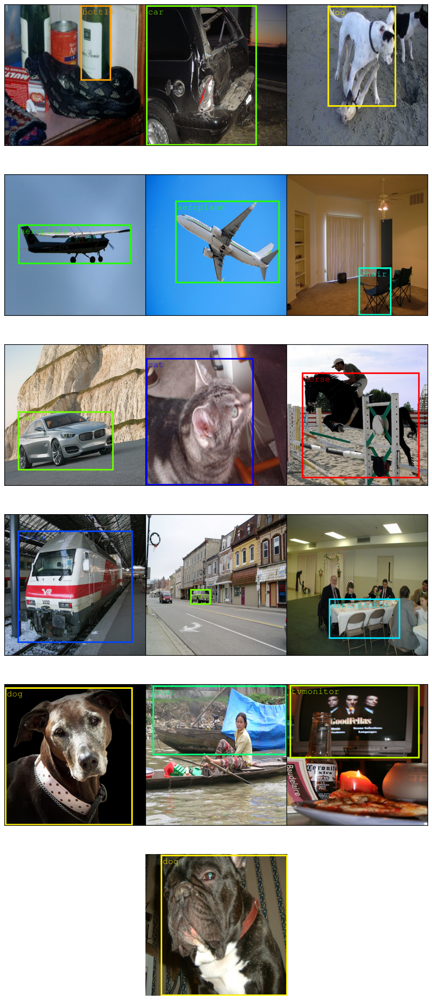

In [5]:
import random, matplotlib
from torchvision.utils import draw_bounding_boxes, make_grid

plt.rcParams["savefig.bbox"] = 'tight'
plt.rcParams['figure.figsize'] = [20, 5]


@torch.no_grad()
def show_image_with_boxes(imgs, boxes, labels, labels2names,nb_im_per_row=3):
    invTrans = transforms.Normalize(
                mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
                std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
            )

    def random_colors(labels2names):
        n = len(labels2names)
        cmap = plt.cm.get_cmap('hsv', n)
        names2colors = {name:matplotlib.colors.to_hex(cmap(i))
             for i,name in enumerate(labels2names)}
        return names2colors

    def process_labels(labels):
        names = []
        for label in labels:
            name = labels2names[int(label.item())]
            names.append(name)
        return names

    if not isinstance(imgs, list):
        imgs = [imgs]
        boxes = [boxes]

    names2colors = random_colors(labels2names)
    
    nrows =len(imgs)//nb_im_per_row
    if len(imgs)%nb_im_per_row:
        nrows+=1
    fig, axs = plt.subplots(nrows=nrows, squeeze=False)
    fig.set_figheight(5*len(axs))
    fig.set_figwidth(15)
    for k in range(0, len(imgs),nb_im_per_row):
        imgs_with_boxes = []
        for img, box,label in zip(imgs[k:k+nb_im_per_row],boxes[k:k+nb_im_per_row],labels[k:k+nb_im_per_row]):
            img = invTrans(img.detach())
            labelnames = process_labels(label)
            colors = [names2colors[name] for name in labelnames]
            img_with_boxes = draw_bounding_boxes(img.mul(255).to(torch.uint8), box, 
                                                 labels=labelnames, font='4_detection_files/FreeMono.ttf', font_size=28, 
                                                 colors=colors, width=5)
            imgs_with_boxes.append(img_with_boxes)
        grid = make_grid(imgs_with_boxes)
        ax = axs[k//nb_im_per_row,0]
        ax.imshow(np.asarray(F.to_pil_image(grid)))
        ax.axis('off')
    plt.show()

@torch.no_grad()
def boxes_as_corners(imgsize, boxes,clamp=False):
    centers = boxes[...,:2]
    extensions = boxes[...,2:]
    mincorners = centers-extensions/2 
    maxcorners = centers+extensions/2
    newboxes = torch.empty_like(boxes)
    newboxes[:,:2] = mincorners
    newboxes[:,2:] = maxcorners
    newboxes[:,0::2]*=imgsize[0]
    newboxes[:,1::2]*=imgsize[1]
    if clamp:
        newboxes[:,0::2] = torch.clamp(newboxes[:,0::2], min=0, max=imgsize[0]-1)
        newboxes[:,1::2] = torch.clamp(newboxes[:,1::2], min=0, max=imgsize[1]-1)
    return newboxes

single_box_trainset = SingleBoxVOCDataset(trainset, imgsize=(448,448), maxsamples=16)
# Dataloader
trainloader = torch.utils.data.DataLoader(single_box_trainset, batch_size=16, shuffle=True)
# visualization
ims,labels,bboxes  = next(iter(trainloader))
boxes =  [ boxes_as_corners(im.shape[1:],box.unsqueeze(0)) for im,box,label in zip(ims,bboxes,labels) if label[-1]!=0]
labels =  [ l[:-1].argmax().unsqueeze(0) for l in labels]

ims = [im for im in ims]
show_image_with_boxes(ims,boxes,labels,single_box_trainset.labels2names)

In [6]:
model_factory = {'resnet18'     : lambda:torchvision.models.resnet18(pretrained=True),
                 'resnet34'     : lambda:torchvision.models.resnet34(pretrained=True),
                 'resnet50'     : lambda:torchvision.models.resnet50(pretrained=True),
                 'resnet152'    : lambda:torchvision.models.resnet152(pretrained=True),
                 'densenet121'  : lambda:torchvision.models.densenet121(pretrained=True),
                 'squeezenet1_1': lambda:torchvision.models.squeezenet1_1(pretrained=True)}

class FeatureExtractor(nn.Module):

    def __init__(self, model_name:str):
        super(FeatureExtractor, self).__init__()
        model = model_factory[model_name]()
        
        self.avg = nn.AdaptiveAvgPool2d((7,7))

        # We freeze the networks
        # we will just perform forward passes, so we do not
        # need to compute any gradients
        # Does the following eliminate some computations ?
        for param in model.parameters():
            param.requires_grad = False

        # We keep only the feature maps of all the models
        # sometimes we can directly access a "features" attribute
        # sometimes we need to explictely extract the layers from the childrens
        if('resnet' in model_name):
            self.body = nn.Sequential(*list(model.children())[:-2])
        elif('densenet' in model_name):
            self.body = model.features
        elif('squeezenet' in model_name):
            self.body = model.features
        elif(model_name == 'mobilenetv2'):
            self.body = model

    def forward(self, x):
        
        return self.avg(self.body(x))



## Precomputing pretrained features
To accelerate the training we will work with frozen pretrained features (using a squeezenet trained on imagenet). Since the features are frozen we may even precompute them on the entire database to accelerate the training further.

**NB:** To save time you may retrieve the following file `/home/public/simonl/DL3A/LabFiles/4_detection_files/tmp/squeezenet1_1prec_trainset.pt` if connected to a classroom computer.

In [8]:
import os
import tqdm
from tqdm.notebook import tqdm


rootdir = '/tmp'
backbone_name = 'squeezenet1_1'

backbone = FeatureExtractor(backbone_name)



class PrecomputedFeatureDataset():
    def __init__(self, dataset, backbone, device, features=None):
        self.dataset = dataset
        self.backbone = backbone.to(device)
        self.device = device
        if features is None:
            self.__precompute_features()
        else:
            self.features = features
        self.__retrieve_targets()
        
    def __precompute_features(self):
        loader = torch.utils.data.DataLoader(self.dataset, batch_size=16, shuffle=False, pin_memory=True, num_workers=4)
        features = []
        progressbar = tqdm(loader, leave=False)
        for item in progressbar:
            ims = item[0].to(self.device)
            features.append(self.backbone(ims).to('cpu'))
        self.features = torch.cat(features)
    
    def __retrieve_targets(self):
        targets = []
        loader = torch.utils.data.DataLoader(self.dataset, batch_size=16, shuffle=False, pin_memory=True, num_workers=4)
        progressbar = tqdm(loader, leave=False)
        for item in progressbar:
            ims = item[0].to(self.device)
            targets.append(item[1:])
        targets = zip(*targets)
        self.targets = tuple(torch.cat(target) for target in targets)
    
    def __getitem__(self,index):
        return (self.features[index],) + tuple(target[index] for target in self.targets)
    
    def __len__(self):
        return len(self.dataset)

train_dataset_filename = f'{rootdir}/{backbone_name}prec_trainset.pt'
if os.path.exists(train_dataset_filename):
    single_box_trainset_prec = torch.load(train_dataset_filename)
else:
    n_train_samples = None
    single_box_trainset = SingleBoxVOCDataset(trainset, imgsize=(448,448), maxsamples=n_train_samples)
    single_box_trainset_prec = PrecomputedFeatureDataset(single_box_trainset, backbone, device)
    torch.save(single_box_trainset_prec, train_dataset_filename)

test_dataset_filename = f'{rootdir}/{backbone_name}prec_testset.pt'
if os.path.exists(test_dataset_filename):
    single_box_testset_prec = torch.load(test_dataset_filename)
else:
    n_test_samples = 100
    single_box_testset = SingleBoxVOCDataset(testset, imgsize=(448,448), maxsamples=n_test_samples)
    single_box_testset_prec = PrecomputedFeatureDataset(single_box_testset, backbone, device)
    torch.save(single_box_testset_prec, test_dataset_filename)


## Defining the model and every optimization objects

In [9]:
class SingleBboxHead(nn.Module):
    def __init__(self, num_features: int, num_classes: int):
        super(SingleBboxHead, self).__init__()
        nh = 64
        self.common_head = nn.Sequential(nn.Linear(num_features, nh), nn.ReLU(), nn.BatchNorm1d(nh))
        self.head_bbox = nn.Sequential(nn.Dropout(), \
                                       nn.Linear(nh, 4), nn.Sigmoid())
        # We output the logits for all the classes. There is no "no-object class"
        self.head_class = nn.Sequential(nn.Linear(nh, num_classes))
        self.flatten = nn.Flatten()

    def forward(self, features):
        # We might get feature maps as input that we need to flatten
        features = self.flatten(features) 
        features = self.common_head(features)

        # All the outputs for the bbox are projected into [0, 1] thanks to the final sigmoid
        y_bbox  = self.head_bbox(features)
        y_class = self.head_class(features)

        return y_bbox, y_class

In [10]:
# Dataloader
trainloader = torch.utils.data.DataLoader(single_box_trainset_prec, batch_size=16, shuffle=True, pin_memory=True, num_workers=4)
testloader = torch.utils.data.DataLoader(single_box_testset_prec, batch_size=16, shuffle=True, pin_memory=True, num_workers=4)
features,labels,bboxes = next(iter(trainloader))
num_features = features[0].numel()
num_channels = features[0].size()[0]
num_classes = single_box_trainset.C
head = SingleBboxHead(num_features, num_classes)
model = head.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=0.0)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.5)
epochs = 10

In [11]:
class CheckpointSystem:
    def __init__(self, filepath, model):
        self.best_loss = None
        self.filepath = filepath
        self.model = model

    def save_if_better(self, loss):
        if (self.best_loss is None) or (loss < self.best_loss):
            print('Updating the model checkpoint')
            torch.save(self.model, self.filepath)
            self.best_loss = loss
            
    def load(self):
        self.model = torch.load(self.filepath)
        return self.model

In [12]:
import tqdm
from tqdm.notebook import tqdm

def train_one_epoch(model: torch.nn.Module,
          loader:torch.utils.data.DataLoader,
          optimizer:torch.optim.Optimizer,
          device: torch.device):
    # We enter train mode. This is useless for the linear layers
    # but is important for layers such as dropout, batchnorm, ...
    model.train()

    inner_progressbar = tqdm(loader, leave=False)
    bbox_loss  = torch.nn.SmoothL1Loss()
    bbox_reg_loss = torch.nn.L1Loss(reduction='sum')
    class_loss = torch.nn.CrossEntropyLoss()

    lambda_bbox = 20.0
    N = 0
    regression_loss, correct = 0.0, 0
    total_nb_batches = len(loader)
    for batch_idx, (inputs, labels, bboxes) in enumerate(inner_progressbar):

        inputs, bboxes, labels = inputs.to(device=device), bboxes.to(device=device), labels.to(device=device)
        labels = labels[:,:-1]
        # Forward propagation
        predicted_bboxes, predicted_logits = model(inputs)

        # Regression loss and classification loss computations
        b_loss = lambda_bbox * bbox_loss(predicted_bboxes, bboxes)
        c_loss = class_loss(predicted_logits, labels)
        total_loss = b_loss + c_loss

        # Accumulate the number of processed samples
        N += inputs.shape[0]

        # Running average of regression loss
        regression_loss += bbox_reg_loss(predicted_bboxes, bboxes).item()/4.0

        # Running average of classification accuracy
        predicted_targets = predicted_logits.argmax(dim=1)
        correct += (predicted_targets == labels.argmax(dim=1)).sum().item()

        # Backward and optimize
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        # Display status
        inner_progressbar.set_postfix(reg_loss=regression_loss/N, class_acc=f'{correct/N:.0%}')

    return regression_loss/N, correct/N

def test(model, loader, device):
    bbox_reg_loss = torch.nn.L1Loss(reduction='sum')
    class_loss = torch.nn.CrossEntropyLoss(reduction='sum')

    # We disable gradient computation which speeds up the computation
    # and reduces the memory usage
    with torch.no_grad():
        # We enter evaluation mode. Again, this makes a difference for dropout, batchnorm, ..
        model.eval()
        N = 0
        regression_loss, correct = 0.0, 0
        for i, (inputs, labels, bboxes) in enumerate(loader):
            labels = labels[:,:-1]
            inputs, bboxes, labels = inputs.to(device=device), bboxes.to(device=device), labels.to(device=device)

            predicted_bboxes, predicted_logits = model(inputs)

            b_loss = bbox_reg_loss(predicted_bboxes, bboxes)/4.0

            N += inputs.shape[0]

            regression_loss += b_loss.item()

            predicted_targets = predicted_logits.argmax(dim=1)
            correct += (predicted_targets == labels.argmax(dim=1)).sum().item()
        return regression_loss/N, correct/N


checkpoint = CheckpointSystem(f'{rootdir}/checkpoint.pt', model)
for t in range(epochs):
    print("Epoch {}".format(t))

    train_reg_loss, train_acc = train_one_epoch(model, trainloader, optimizer, device)

    val_reg_loss, val_acc = test(model, testloader, device)
    print(f'Train : Bbox L1 Loss : {train_reg_loss:.4f}, Class Acc : {train_acc:.0%}')
    print(f'Validation : Bbox L1 Loss : {val_reg_loss:.4f}, Class Acc : {val_acc:.0%}')
    scheduler.step()
    checkpoint.save_if_better(val_reg_loss + (1.0 - val_acc))

Epoch 0


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.1448, Class Acc : 56%
Validation : Bbox L1 Loss : 0.1445, Class Acc : 70%
Updating the model checkpoint
Epoch 1


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.1333, Class Acc : 93%
Validation : Bbox L1 Loss : 0.1313, Class Acc : 59%
Epoch 2


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.1269, Class Acc : 98%
Validation : Bbox L1 Loss : 0.1274, Class Acc : 67%
Epoch 3


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.1197, Class Acc : 99%
Validation : Bbox L1 Loss : 0.1272, Class Acc : 72%
Updating the model checkpoint
Epoch 4


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.1153, Class Acc : 99%
Validation : Bbox L1 Loss : 0.1239, Class Acc : 65%
Epoch 5


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.1118, Class Acc : 99%
Validation : Bbox L1 Loss : 0.1276, Class Acc : 64%
Epoch 6


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.1091, Class Acc : 99%
Validation : Bbox L1 Loss : 0.1264, Class Acc : 66%
Epoch 7


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.1080, Class Acc : 98%
Validation : Bbox L1 Loss : 0.1258, Class Acc : 61%
Epoch 8


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.1069, Class Acc : 98%
Validation : Bbox L1 Loss : 0.1264, Class Acc : 65%
Epoch 9


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.1042, Class Acc : 98%
Validation : Bbox L1 Loss : 0.1275, Class Acc : 60%


In [13]:
best_model = checkpoint.load()
best_model.eval()
val_reg_loss, val_acc = test(best_model, testloader, device)
print(f'Validation : Bbox Loss : {val_reg_loss:.4f}, Class Acc : {val_acc:.0%}')
train_reg_loss, train_acc = test(best_model, trainloader, device)
print(f'Train : Bbox Loss : {train_reg_loss:.4f}, Class Acc : {train_acc:.0%}')

Validation : Bbox Loss : 0.1272, Class Acc : 72%
Train : Bbox Loss : 0.0971, Class Acc : 100%


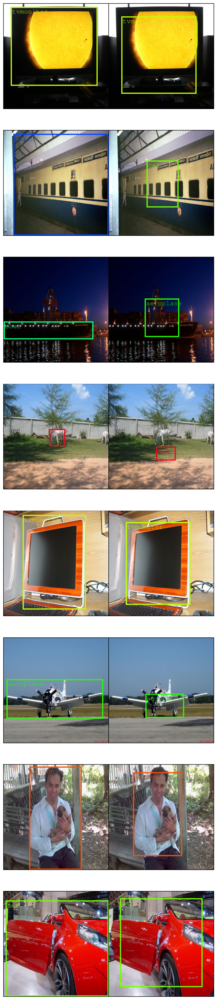

In [14]:
@torch.no_grad()
def visual_check(mode='train'):
    nb_samples = 8
    if mode == 'train':
        single_box_dataset = SingleBoxVOCDataset(trainset, imgsize=(448,448), maxsamples=nb_samples)
        single_box_dataset_prec = single_box_trainset_prec
    else:
        single_box_dataset = SingleBoxVOCDataset(testset, imgsize=(448,448), maxsamples=nb_samples)
        single_box_dataset_prec = single_box_testset_prec
        
    loader_im = iter(torch.utils.data.DataLoader(single_box_dataset, batch_size=nb_samples, shuffle=False, pin_memory=True, num_workers=4))
    loader_feat = iter(torch.utils.data.DataLoader(single_box_dataset_prec, batch_size=nb_samples, shuffle=False, pin_memory=True, num_workers=4))
    labels2names = single_box_dataset.labels2names

    ims,labels,bboxes  = next(loader_im)
    features,labels2,bboxes2  = next(loader_feat)
    assert torch.allclose(labels2, labels) and torch.allclose(bboxes2, bboxes)

    boxes_gt =  [ boxes_as_corners(im.shape[1:],box.unsqueeze(0)) for im,box,label in zip(ims,bboxes,labels) if label[-1]!=0]
    labels_gt =  [ l[:-1].argmax().unsqueeze(0) for l in labels]
    ims = [im for im in ims]
    
    
    predicted_bboxes, logits = best_model(features)
    predicted_bboxes =  [ boxes_as_corners(im.shape[1:],box.unsqueeze(0)) for im,box in zip(ims,predicted_bboxes)]
    predicted_labels =  [ l.argmax().unsqueeze(0) for l in logits]
    
    def interleave(list1, list2):
        return [val for pair in zip(list1, list2) for val in pair]

    show_image_with_boxes(interleave(ims,ims),\
                          interleave(boxes_gt, predicted_bboxes),\
                          interleave(labels_gt, predicted_labels),labels2names,nb_im_per_row=2)

visual_check('test')

## Exercise : Detector Head variants
Based on your lecture on model architectures, propose one or two variants of `SingleBboxHead` and rerun the training for the same number of epochs. Compare with the original implementation in terms of:
* train performance
* validation performance
* compute time

# Part 2: multiple object detection a la YOLO

## Part 1: YoloV1 architecture
### &#8594; Principle
The principle of Yolo is depicted in the following figure. In essence, the input image is virtually split into $S\times S$ cells (S=3 in the illustration). The model is responsible for predicting $B=2$ boxes for each cell.
By convention, each box should be centered within its associated cell, but can expand outside that cell. Note, that this convention is not enforced strictly by the model, but simply in the supervision (see [Part 2](#part_2)).
![YoloV1Principle](4_detection_files/notebook_img/yolo_working.png "Principle")

### &#8594; Global architecture (S=7)
The architecture is decomposed into a CNN backbone, and a fully-connected  head. The following graph depicts the architecture for $S=7$. In this graph, $n_C$ represent the number of classes in the dataset (for PascalVOC $n_C=20$).

![YoloV1Archi](4_detection_files/notebook_img/yolo_archi.png "global architecture")

*NB:* the output tensor is of size $S\times S \times (n_C+5n_B)$ because for each cell (among the $S\times S$ cells), $n_B$ boxes predictions are in competitition. Each box is encoded as a 5-tuple $(p,x,y,w,h)$, where $p$ is the confidence, and the rest is the spatial extension. This account for $5n_B$ values in the cell representation. The other $n_C$ values correspond to a 1-hot vector encoding the class associated to the box. Note that, a single box out of 2 will be retained. Therefore, a single 1hot vector of size $n_C$ is attached to each cell (and not 2). 

### &#8594; Backbone 
For the backbone we shall again use a `squeezenet1_1` pretrained on imagenet.


## Exercise : Implementing the YOLO convention for multiple box per image

In this exercise, you need to implement (overload) the method `_labeled_boxes_as_tensors` of the class `YOLOMultiBoxVOCDataset`.

In [14]:
class YOLOMultiBoxVOCDataset(SingleBoxVOCDataset):
    '''Mini wrapper the SingleBoxVOCDataset to extract SxS boxes following the scheme of YOLO'''
    def __init__(self,internal_dataset:VOCDetection, imgsize:tuple, ncells:int=7, maxsamples=None):
        self.S = ncells
        super().__init__(internal_dataset, imgsize,maxsamples)
        
   
    def _labeled_boxes_as_tensors(self, labels, bboxes):
        '''Overloads the implementation of SingleBoxVOCDataset to implement the YOLO convention'''
        
        raise Exception('You need to implement this function')
        labeled_box = torch.zeros((...))
        
        return labeled_box
    
multi_box_trainset = YOLOMultiBoxVOCDataset(trainset, imgsize=(448,448), maxsamples=10)

def test_YOLO_convention():
    im, labels, bboxes = multi_box_trainset[0]
    if bboxes.shape == torch.Size([7, 7, 4]) and \
       torch.allclose(bboxes[3,1], torch.tensor([0.1290, 0.6708, 1.8340, 1.9480]), atol=1e-3) and \
       torch.allclose(bboxes[3,2], torch.tensor([0.,0., 0., 0.]), atol=1e-3):
        print('Current exercise: OK')
    else:
        print('Current exercise: NOK')
test_YOLO_convention()

Current exercise: OK


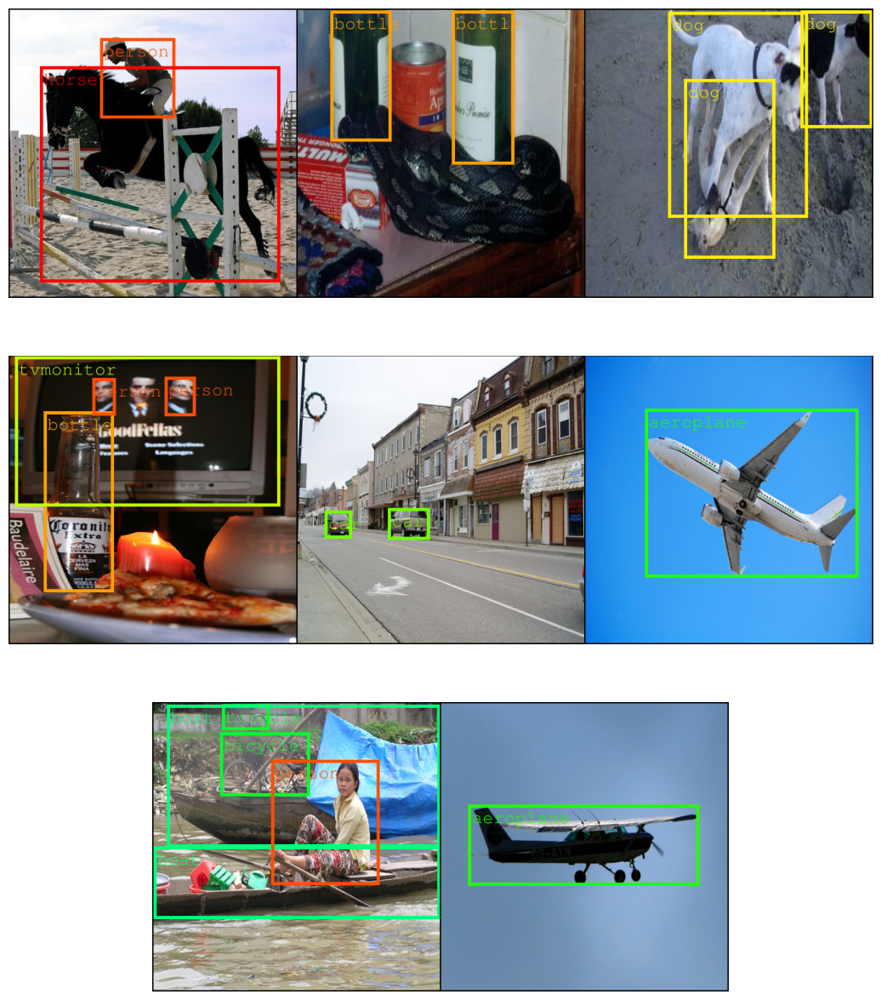

In [15]:
@torch.no_grad()
def valid_boxes_as_corners(imgsize, boxes, valids, ncells=7, clamp=False):
    S=ncells
    centers = boxes[...,:2]
    extensions = boxes[...,2:]/S
    for col in range(S):
        centers[col,:,0] = (centers[col,:,0]+col)/S
        row = col
        centers[:,row,1] = (centers[:,row,1]+row)/S
    centers = centers[valids]
    extensions = extensions[valids]
    mincorners = centers-extensions/2 
    maxcorners = centers+extensions/2
    newboxes = torch.empty_like(boxes[valids])
    newboxes[:,:2] = mincorners
    newboxes[:,2:] = maxcorners
    newboxes[:,0::2]*=imgsize[0]
    newboxes[:,1::2]*=imgsize[1]
    if clamp:
        newboxes[:,0::2] = torch.clamp(newboxes[:,0::2], min=0, max=imgsize[0]-1)
        newboxes[:,1::2] = torch.clamp(newboxes[:,1::2], min=0, max=imgsize[1]-1)
    return newboxes.to(int)

# Dataloader
multi_box_trainset = YOLOMultiBoxVOCDataset(trainset, imgsize=(448,448), maxsamples=8)
loader = torch.utils.data.DataLoader(multi_box_trainset, batch_size=8, shuffle=False)
# visualization
ims,labels,bboxes  = next(iter(loader))
valids = (labels[...,-1]!=0)
boxes =  [ valid_boxes_as_corners(im.shape[1:],box, valid, ncells=multi_box_trainset.S) for im,box,valid in zip(ims,bboxes,valids)]
labels =  [ l[valid][...,:-1].argmax(dim=-1) for l,valid in zip(labels,valids)]
ims = [im for im in ims]

show_image_with_boxes(ims,boxes,labels,multi_box_trainset.labels2names)

In [16]:
import os

train_dataset_filename = f'{rootdir}/{backbone_name}prec_trainset_multi.pt'

if os.path.exists(train_dataset_filename):
    multi_box_trainset_prec = torch.load(train_dataset_filename)
else:
    n_train_samples = None
    multi_box_trainset = YOLOMultiBoxVOCDataset(trainset, imgsize=(448,448), maxsamples=n_train_samples)
    features_train = single_box_trainset_prec.features
    multi_box_trainset_prec = PrecomputedFeatureDataset(multi_box_trainset, backbone, device, features=features_train)
    torch.save(multi_box_trainset_prec, train_dataset_filename)

test_dataset_filename = f'{rootdir}/{backbone_name}prec_testset_multi.pt'
if os.path.exists(test_dataset_filename):
    multi_box_testset_prec = torch.load(test_dataset_filename)
else:
    n_test_samples = 100
    multi_box_testset = YOLOMultiBoxVOCDataset(testset, imgsize=(448,448), maxsamples=n_test_samples)
    features_test = single_box_testset_prec.features
    multi_box_testset_prec = PrecomputedFeatureDataset(multi_box_testset, backbone, device, features=features_test)
    torch.save(multi_box_testset_prec, test_dataset_filename)


## Exercise: defining the multi-box dector head

In this exercise, you need to implement forward method of the `YOLOMultipleBboxHead` class. You can take inspiration from the corresponding method of `SingleBboxHead`. 

Beware, in this case, the shape of the output tensors (`y_bbox`, `y_class`) have a spatial dimension (of resolution $7\times 7$ if `num_cells=7`).
In addition, you will need an additional ouptut logit tensor, to stipulate the confidence associated to each predicted box. 
Last, note that if you rely on a sigmoid for the box head, you need to take care of the range of the box components, since some of them are not in $[0,1]$.

**NB:** the features have a spatial resolution that may be different from $7\times 7$. Yet you may still make good use of the spatial structure, by replacing the `Flatten`, `Linear`  and `BatchNorm1d` layers by well-chosen layers.

In [18]:
class YOLOMultipleBboxHead(nn.Module):
    def __init__(self, num_channels: int,
                 num_classes: int,
                 num_cells: int=7,
                 num_box: int=1):
        super().__init__()
        raise Exception('You need to implement this function')
        
        nh = 64
        self.common_head = nn.Sequential(...)
        # The Bbox head outputs 4 x num_box  numbers per grid cell
        # i.e. every grid cell is predicting num_box bounding boxes
        self.head_bbox = nn.Sequential(...)

        # The class head outputs a distribution over the classes
        # and a number which is the probability that the
        # cell contains an object
        self.head_class = nn.Sequential(...)

        #Useful to project an activation map to the correct spatial resolution
        self.avg = m = nn.AdaptiveAvgPool2d((num_cells,num_cells)) 
        self.num_cells = num_cells

    def forward(self, features):
        raise Exception('You need to implement this function')
        y_bbox  = ...
        
        y_class = ...
        

        # In the return, we split the output with the
        # bbox_regression, class_logits, objectness_probability
        return y_bbox, y_class[..., :-1], y_class[...,-1]
    
def test_YOLOMultipleBboxHead():
    loader = torch.utils.data.DataLoader(multi_box_trainset_prec, batch_size=4, shuffle=False, pin_memory=True, num_workers=4)
    features,labels,bboxes = next(iter(trainloader))
    features = features.to(device)
    num_features = features[0].numel()
    num_channels = features[0].size()[0]
    num_classes = single_box_trainset.C
    ncells = multi_box_trainset.S
    head = YOLOMultipleBboxHead(num_channels, num_classes, num_cells=ncells,num_box=1).to(device)
    y_bbox, y_labels, y_has_obj = head(features)
    test_result = y_bbox.shape==torch.Size([16, 7, 7, 4]) and \
                  y_labels.shape==torch.Size([16, 7, 7, 20]) and\
                  y_has_obj.shape==torch.Size([16, 7, 7])
    if test_result:
        print('Current exercise: OK')
    else:
        print('Current exercise: NOK')

test_YOLOMultipleBboxHead()


Current exercise: OK


## Defining the model and other optimization related objects 


In [19]:
# Dataloader
trainloader = torch.utils.data.DataLoader(multi_box_trainset_prec, batch_size=16, shuffle=True, pin_memory=True, num_workers=4)
testloader = torch.utils.data.DataLoader(multi_box_testset_prec, batch_size=16, shuffle=True, pin_memory=True, num_workers=4)
features,labels,bboxes = next(iter(trainloader))
num_features = features[0].numel()
num_channels = features[0].size()[0]
num_classes = multi_box_trainset.C
ncells = multi_box_trainset.S
head = YOLOMultipleBboxHead(num_channels, num_classes, num_cells=ncells,num_box=1)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

multi_model = head.to(device)
optimizer = torch.optim.Adam(multi_model.parameters(), lr=0.01, weight_decay=0.0)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.5)

## Exercise: Training the model
Adapt the `train_one_epoch` and `test` functions to fit the YOLO conventions. To this end, you will need 3 loss components:
* classification loss for label prediction
* regression loss for boxes predictions
* objectness loss (binary classification) for has_obj_logits predictions

You can train it for a few epochs and verify if the model fits the training set and starts to generalize.

**NB:** Note that the classes are not well balanced, and since most cells are not populated, the binary classification problem is also imbalanced. To improve this aspect, you can use a `weight` arguments in the corresponding losses.

In [20]:
from torch.nn.functional import cross_entropy, binary_cross_entropy

def train_one_epoch(model: torch.nn.Module,
          loader:torch.utils.data.DataLoader,
          optimizer:torch.optim.Optimizer,
          device: torch.device):
    # We enter train mode. This is useless for the linear model
    # but is important for layers such as dropout, batchnorm, ...
    model.train()


    inner_progressbar = tqdm(loader, leave=False)

    lambda_bbox = 200.0
    
    Nobjects = 0 # stands for the number of objects (there are several onjects per sample) encountered so far
    Nsamples = 0 # stands for the number of samples encountered so far
    regression_loss, correct, objectness_loss = 0.0, 0, 0.0
    for batch_idx, (inputs, labels, bboxes) in enumerate(inner_progressbar):
        inputs, bboxes, labels = inputs.to(device=device), bboxes.to(device=device), labels.to(device=device)
        has_obj = labels[...,-1]
        labels = labels[...,:-1]
        
        raise Exception('You need to implement this function')
        '''Here you need to compute
        - b_loss (for box regression)
        - c_loss (for label classification)
        - obj_loss (for objectness confidence)
        
        Besides, for display purpose, you need to accumulate (in a running average mode) over all batches:
        - regression_loss (same as b_loss but accumulated)
        - correct (number of correct labels among valid objects)
        - objectness_loss (same as obj_loss but accumulated)
        '''
        
        # Backward and optimize
        optimizer.zero_grad()
        b_loss.backward(retain_graph=True)
        c_loss.backward(retain_graph=True)
        obj_loss.backward()
        optimizer.step()

        # Display status
        inner_progressbar.set_postfix(reg_loss=regression_loss/Nobjects, class_acc=f'{correct/Nobjects:.0%}', obj_loss=f'{objectness_loss/Nsamples}')

    return regression_loss/Nobjects, correct/Nobjects, objectness_loss/Nsamples

def test(model, loader, device):
    with torch.no_grad():
        model.eval()
        Nobjects = 0
        Nsamples = 0
        regression_loss, correct, objectness_loss = 0.0, 0, 0.0
        for i, (inputs, labels, bboxes) in enumerate(loader):

            inputs, bboxes, labels = inputs.to(device=device), bboxes.to(device=device), labels.to(device=device)
            has_obj = labels[...,-1]
            labels = labels[...,:-1]

            raise Exception('You need to implement this function')
            '''Here you need to compute the accumulated criteria (similarly to train_one_epoch)
            - regression_loss (same as b_loss but accumulated)
            - correct (number of correct labels among valid objects)
            - objectness_loss (same as obj_loss but accumulated)
            '''
            
        return regression_loss/Nobjects, correct/Nobjects, objectness_loss/Nsamples
    
checkpoint = CheckpointSystem(f'{rootdir}/checkpoint_multi.pt', multi_model)

for t in range(epochs):
    print("Epoch {}".format(t))

    train_reg_loss, train_acc, train_obj_loss = train_one_epoch(multi_model, trainloader, optimizer, device)

    val_reg_loss, val_acc, val_obj_loss = test(multi_model, testloader, device)
    print(f'Train : Bbox L1 Loss : {train_reg_loss:.4f}, Class Acc : {train_acc:.0%}, Obj Acc : {train_obj_loss:.4f}')
    print(f'Validation : Bbox L1 Loss : {val_reg_loss:.4f}, Class Acc : {val_acc:.0%}, Obj Loss : {val_obj_loss:.4f}')
    scheduler.step()
    checkpoint.save_if_better(val_reg_loss + val_obj_loss + (1.0 - val_acc))

Epoch 0


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.8475, Class Acc : 29%, Obj Acc : 0.2481
Validation : Bbox L1 Loss : 0.7470, Class Acc : 42%, Obj Loss : 0.1870
Updating the model checkpoint
Epoch 1


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.7946, Class Acc : 31%, Obj Acc : 0.2057
Validation : Bbox L1 Loss : 0.7047, Class Acc : 46%, Obj Loss : 0.1833
Updating the model checkpoint
Epoch 2


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.7839, Class Acc : 32%, Obj Acc : 0.2011
Validation : Bbox L1 Loss : 0.7065, Class Acc : 44%, Obj Loss : 0.1818
Epoch 3


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.7710, Class Acc : 32%, Obj Acc : 0.1980
Validation : Bbox L1 Loss : 0.6897, Class Acc : 43%, Obj Loss : 0.1815
Epoch 4


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.7611, Class Acc : 32%, Obj Acc : 0.1964
Validation : Bbox L1 Loss : 0.6982, Class Acc : 43%, Obj Loss : 0.1822
Epoch 5


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.7582, Class Acc : 32%, Obj Acc : 0.1958
Validation : Bbox L1 Loss : 0.6981, Class Acc : 41%, Obj Loss : 0.1815
Epoch 6


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.7568, Class Acc : 31%, Obj Acc : 0.1961
Validation : Bbox L1 Loss : 0.6884, Class Acc : 44%, Obj Loss : 0.1825
Updating the model checkpoint
Epoch 7


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.7493, Class Acc : 32%, Obj Acc : 0.1960
Validation : Bbox L1 Loss : 0.6929, Class Acc : 46%, Obj Loss : 0.1822
Updating the model checkpoint
Epoch 8


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.7449, Class Acc : 32%, Obj Acc : 0.1959
Validation : Bbox L1 Loss : 0.6812, Class Acc : 43%, Obj Loss : 0.1825
Epoch 9


  0%|          | 0/358 [00:00<?, ?it/s]

Train : Bbox L1 Loss : 0.7406, Class Acc : 32%, Obj Acc : 0.1961
Validation : Bbox L1 Loss : 0.7044, Class Acc : 45%, Obj Loss : 0.1820


In [21]:
best_model = checkpoint.load()
best_model.eval()
val_reg_loss, val_acc, val_obj_loss = test(best_model, testloader, device)
print(f'Validation : Bbox Loss : {val_reg_loss:.4f}, Class Acc : {val_acc:.0%}')
train_reg_loss, train_acc, train_obj_loss = test(best_model, trainloader, device)
print(f'Train : Bbox Loss : {train_reg_loss:.4f}, Class Acc : {train_acc:.0%}')

Validation : Bbox Loss : 0.6929, Class Acc : 46%
Train : Bbox Loss : 0.6883, Class Acc : 34%


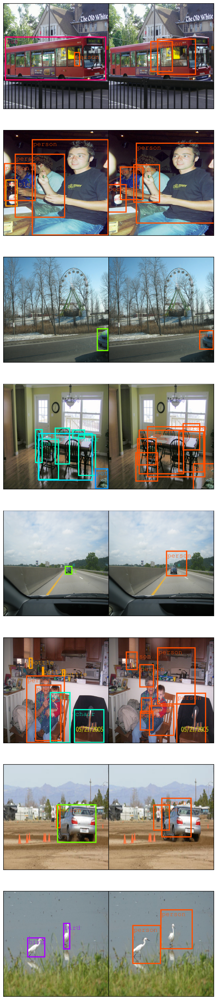

In [22]:
@torch.no_grad()
def visual_check_multi(mode='train', has_box_mode='gt'):
    nb_samples = 8
    if mode == 'train':
        multi_box_dataset = YOLOMultiBoxVOCDataset(trainset, imgsize=(448,448), maxsamples=nb_samples*2)
        multi_box_dataset_prec = multi_box_trainset_prec
    else:
        multi_box_dataset = YOLOMultiBoxVOCDataset(testset, imgsize=(448,448), maxsamples=nb_samples*2)
        multi_box_dataset_prec = multi_box_testset_prec
    loader_im = iter(torch.utils.data.DataLoader(multi_box_dataset, batch_size=nb_samples, shuffle=False, pin_memory=True, num_workers=4))
    loader_feat = iter(torch.utils.data.DataLoader(multi_box_dataset_prec, batch_size=nb_samples, shuffle=False, pin_memory=True, num_workers=4))
    labels2names = multi_box_dataset.labels2names
    ncells = multi_box_dataset.S

    ims,labels,bboxes  = next(loader_im)
    features,labels2,bboxes2  = next(loader_feat)
    ims,labels,bboxes  = next(loader_im)
    features,labels2,bboxes2  = next(loader_feat)
    assert torch.allclose(labels2, labels) and torch.allclose(bboxes2, bboxes)

    valids_gt = (labels[...,-1]!=0)
    boxes_gt =  [ valid_boxes_as_corners(im.shape[1:],box, valid, ncells=ncells) for im,box,valid in zip(ims,bboxes,valids_gt)]
    labels_gt =  [ l[valid][...,:-1].argmax(dim=-1) for l,valid in zip(labels,valids_gt)]
    ims = [im for im in ims]
    
    predicted_bboxes, logits, valid_logits  = best_model(features)
    if has_box_mode == 'gt':
        predicted_valids = valids_gt
    else:
        predicted_valids = (torch.sigmoid(valid_logits)>0.06)
    predicted_bboxes =  [ valid_boxes_as_corners(im.shape[1:],box, valid, ncells=ncells) for im,box,valid in zip(ims,predicted_bboxes,predicted_valids)]
    predicted_labels =  [  l[valid].argmax(dim=-1) for l,valid in zip(logits,predicted_valids)]
    
    def interleave(list1, list2):
        return [val for pair in zip(list1, list2) for val in pair]

    show_image_with_boxes(interleave(ims,ims),\
                          interleave(boxes_gt, predicted_bboxes),\
                          interleave(labels_gt, predicted_labels),\
                          labels2names,nb_im_per_row=2)

visual_check_multi('test')

## What to submit
Your submission shall consist of the current notebook. Besides the code and the associated result, we expect a markdown section summarizing your work. You shall discuss  the following aspects:
* a clear statement about what you have successfully implemented and what you couldn't 
* a discussion of every design choice you've made and the rationale behind them
* an ablation study where you expose the performance obtained depending on variants of the training setting. In this ablation study you may consider the following aspects:
    * architectural designs of the predictor head
    * loss functions (especially how to deal with class imbalance) 
    * data augmentation (beware, since the features are precomputed possible augmentations are limited)

* You may also implement an discuss other mechanisms / evaluation aspect that you have knowledge of, such as:
    * Non Maximum Suppression
    * mAP evaluation for labeled boxes
    * Precision-Recall curves for the `has_obj` output
    * extension to num_boxes>1 (currently only 1 box per cell is implemented) 